In [3]:
# Install Ultralytics library
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 4.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [4]:
!pip install -U ipywidgets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 21.8 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [9]:
!pip install dill

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 1.3 MB/s eta 0:00:00


## Mount Google Drive

In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


## Specifying the data paths: Kaggle (Original source for Yolov8)

In [36]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'top-view-vehicle-detection-image-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4107330%2F7166601%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240416%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240416T012533Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D1088ccd27587ba794bb05b5c1ebdf583965e9b407c5d65617e084d836d2aee944dbac65ed68bc813e26fe4d7d176a57ecf51e6ecd96cabd82824e120825022b8968070965b36d69c264178767d4558c9a812190c86201a51487827b16be9d6c4945a5b9cef8015946b32f6bc522a9b755efe547d40e9923dfd0f0729c276f5c94151c9703f1cc6eb654be08dff5ed93df29f63ae8d1bc975764bbe25cf14433f2cce4ea44c2c3d05a3add7f627c51a72c9cf40c991945931ae6523cc972c5069625be4d6302550302a2bb8aa0e64c77e73b323103810640c609bb1bd226b0d3789c46242c4bff8c0ddaf113980c814d9ce647a58b2c193de20cdb14851d4f46f'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 47836023 bytes downloaded
Downloaded and uncompressed: top-view-vehicle-detection-image-dataset
Data source import complete.


## Additional Packages

In [37]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

In [11]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

## Yolov8 (FINE-TUNED)

In [12]:
import torch
import torchvision.transforms as transforms
from PIL import Image

# Step 1: Load the pretrained model
checkpoint = torch.load('best.pt')  # Load your model, adjust the path accordingly
model = checkpoint['model']  # Extract the model from the dictionary
model.eval()  # Set the model to evaluation mode


DetectionModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): C2f(
      (cv1): Conv(
        (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
    

In [14]:
# Define the dataset_path
dataset_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



In [15]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 536
Number of validation images: 90
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


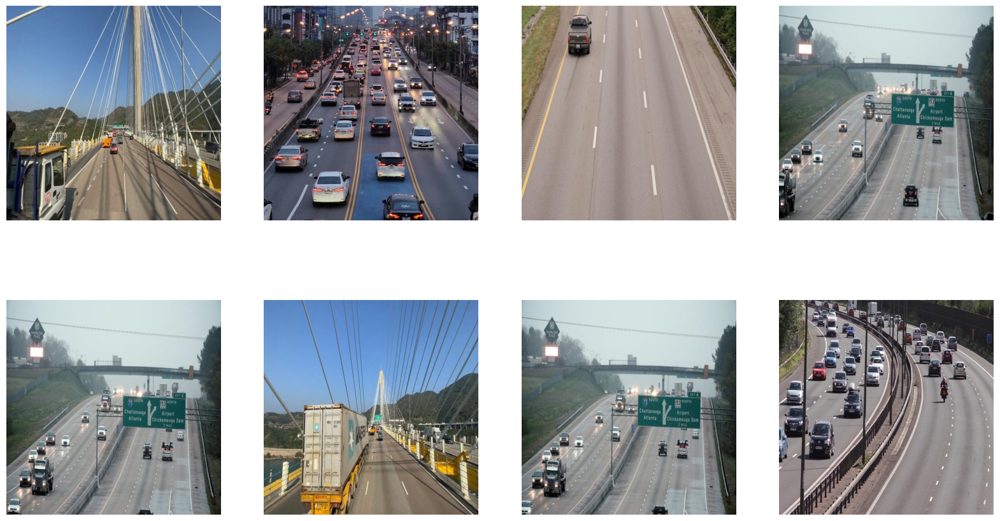

In [16]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

#plt.suptitle('Sample Images from Training Dataset', fontsize=20)
#plt.tight_layout()
#plt.show()

In [18]:
# Construct the path to the best model weights file using os.path.join
best_model_path = 'best.pt'

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics YOLOv8.2.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 37.1MB/s]
val: Scanning /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/labels... 90 images, 0 backgrounds, 0 corrupt: 100%|██████████| 90/90 [00:00<00:00, 417.24it/s]

val: New cache created: /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [01:15<00:00, 12.53s/it]


                   all         90        937       0.86      0.928      0.952      0.691
Speed: 30.9ms preprocess, 761.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/val


In [19]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.860
metrics/recall(B),0.928
metrics/mAP50(B),0.952
metrics/mAP50-95(B),0.691
fitness,0.717


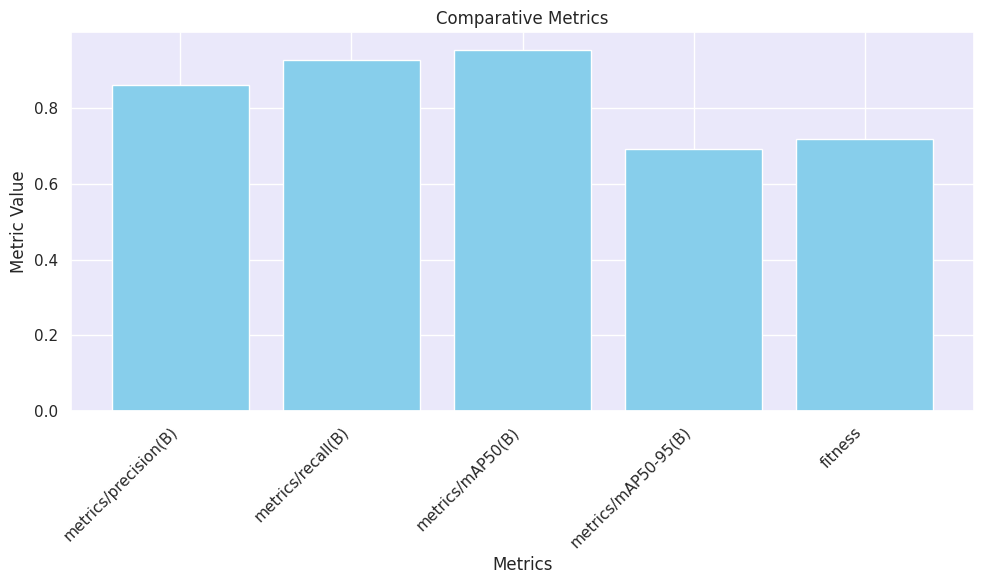

In [20]:
# Testing some basic visualization

import matplotlib.pyplot as plt

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(metrics_df.index, metrics_df['Metric Value'], color='skyblue')

# Add labels and title
plt.xlabel('Metrics')
plt.ylabel('Metric Value')
plt.title('Comparative Metrics')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show plot
plt.tight_layout()
plt.show()


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 Vehicles, 197.4ms
Speed: 4.8ms preprocess, 197.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


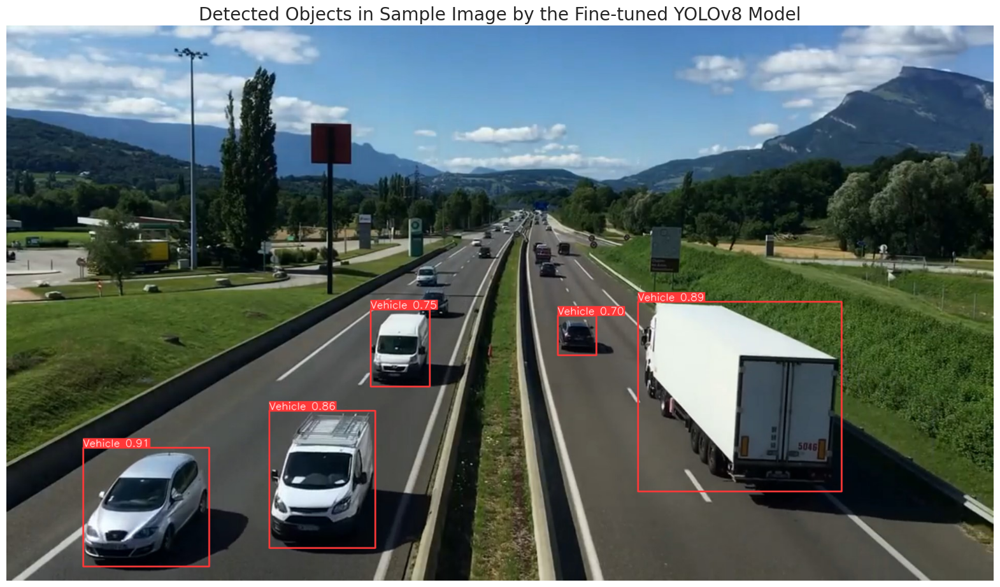

In [23]:
# Path to the image file
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

## Originally pre-trained Yolov8 Model

In [56]:
# Construct the path to the best model weights file using os.path.join
old_model_path = 'yolov8n.pt'

# Load the best model weights into the YOLO model
best_model = YOLO(old_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics YOLOv8.2.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs


val: Scanning /content/datasets/coco/labels/val2017... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:20<00:00, 241.33it/s]


val: New cache created: /content/datasets/coco/labels/val2017.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [22:29<00:00,  4.31s/it]


                   all       5000      36335      0.633      0.475      0.521      0.371
                person       5000      10777      0.754      0.673      0.745      0.514
               bicycle       5000        314      0.687      0.392      0.457      0.265
                   car       5000       1918      0.646      0.515      0.561      0.364
            motorcycle       5000        367       0.71       0.58      0.655      0.414
              airplane       5000        143      0.814      0.766      0.832      0.653
                   bus       5000        283      0.746      0.643      0.739       0.62
                 train       5000        190      0.798       0.77      0.834      0.646
                 truck       5000        414      0.549      0.399      0.435      0.293
                  boat       5000        424      0.583        0.3      0.377       0.21
         traffic light       5000        634      0.644      0.345      0.409      0.211
          fire hydran

In [57]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.633
metrics/recall(B),0.475
metrics/mAP50(B),0.521
metrics/mAP50-95(B),0.371
fitness,0.386


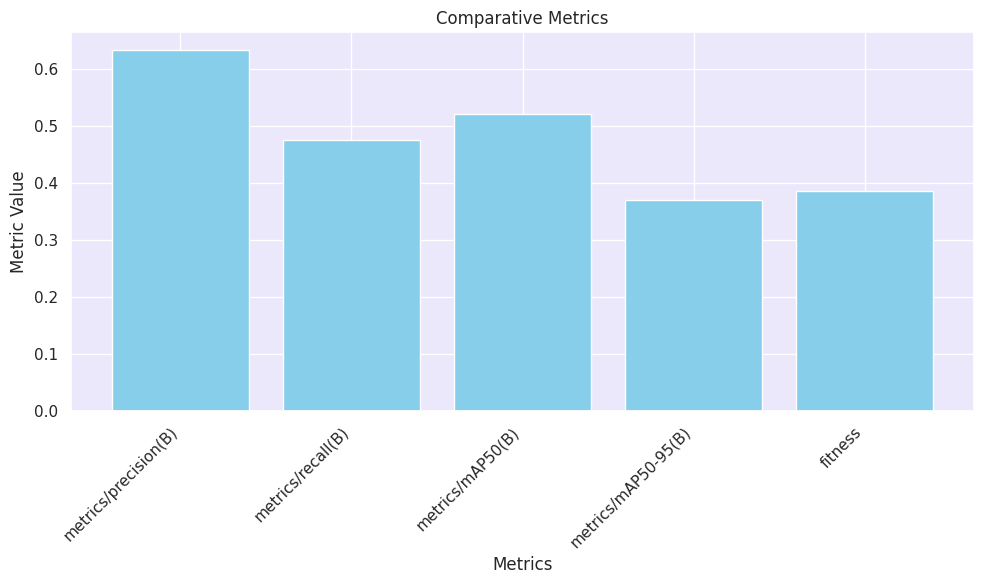

In [58]:
import matplotlib.pyplot as plt

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(metrics_df.index, metrics_df['Metric Value'], color='skyblue')

# Add labels and title
plt.xlabel('Metrics')
plt.ylabel('Metric Value')
plt.title('Comparative Metrics')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show plot
plt.tight_layout()
plt.show()


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 1 car, 304.1ms
Speed: 4.4ms preprocess, 304.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


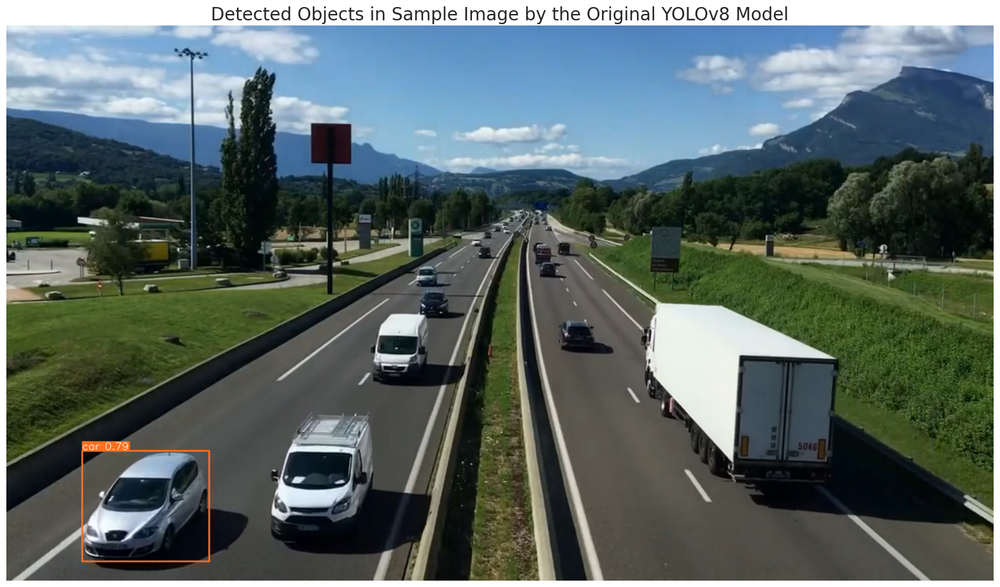

In [60]:
# Path to the image file
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Original YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

## Fast RCNN Base

In [51]:
import torch
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import numpy as np
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [52]:
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [53]:
import os
import xml.etree.ElementTree as ET
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, root_dir, mode):
        self.root_dir = root_dir
        self.mode = mode
        self.image_dir = os.path.join(root_dir, mode, 'images')
        self.annotation_dir = os.path.join(root_dir, mode, 'annotations')
        self.image_files = os.listdir(self.image_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_filename = self.image_files[idx]
        image_path = os.path.join(self.image_dir, image_filename)
        image = Image.open(image_path).convert("RGB")

        annotation_filename = os.path.splitext(image_filename)[0] + '.xml'
        annotation_path = os.path.join(self.annotation_dir, annotation_filename)
        try:
            bboxes, labels = self.load_annotations(annotation_path)
        except Exception as e:
            print(f"Error loading annotations for {image_filename}: {e}")
            return None

        # Create figure and axes
        #fig, ax = plt.subplots(1)
        #ax.imshow(image)

        # Add bounding boxes
        for bbox in bboxes:
            xmin, ymin, xmax, ymax = bbox
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        # plt.show()

        return image, {
            'boxes': torch.tensor(bboxes, dtype=torch.float32),
            'labels': torch.tensor(labels, dtype=torch.int64)
        }

    def load_annotations(self, annotation_path):
        tree = ET.parse(annotation_path)
        root = tree.getroot()

        bboxes = []
        labels = []

        for obj in root.findall('object'):
            name = obj.find('name').text
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)

            # Check if bounding box coordinates are valid
            if xmax <= xmin or ymax <= ymin:
                raise ValueError(f"Invalid bounding box coordinates for {name} in {annotation_path}")

            bboxes.append([xmin, ymin, xmax, ymax])
            labels.append(1)  # Assuming all objects are of the same class

        return bboxes, labels

# Test the dataset
dataset_path2 = '/content/drive/MyDrive/CV_Dataset/FasterRCNN_data2'
dataset = CustomDataset(dataset_path2, 'valid')
image, target = dataset[0]  # Visualize the first image with its bounding boxes

In [54]:

def evaluate_model(model, dataset):
    model.eval()

    y_true = []
    y_scores = []
    y_pred = []

    for i in range(len(dataset)):
        image, target = dataset[i]
        if target is None:
            continue

        # Get ground truth labels
        true_boxes = target['boxes'].numpy()
        true_labels = target['labels'].numpy()

        # Convert image to tensor
        image_tensor = TF.to_tensor(image)
        image_tensor = image_tensor.unsqueeze(0)

        # Perform inference
        with torch.no_grad():
            prediction = model(image_tensor)

        # Get predicted boxes and scores
        pred_boxes = prediction[0]['boxes'].numpy()
        scores = prediction[0]['scores'].numpy()

        # Match predicted boxes with true boxes
        matched_true_boxes = np.zeros(len(true_boxes), dtype=bool)
        for pred_box, score in zip(pred_boxes, scores):
            iou = calculate_iou(pred_box, true_boxes)
            max_iou_idx = np.argmax(iou)
            if iou[max_iou_idx] >= 0.5 and not matched_true_boxes[max_iou_idx]:
                y_true.append(1)
                y_scores.append(score)
                y_pred.append(1)
                matched_true_boxes[max_iou_idx] = True
            else:
                y_true.append(0)
                y_scores.append(score)
                y_pred.append(0)

    # Calculate precision and recall
    precision, recall, _ = precision_recall_curve(y_true, y_scores)

    # Calculate average precision
    average_precision = average_precision_score(y_true, y_scores)

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Calculate mAP50 and mAP50-95
    mAP50 = average_precision
    mAP50_95 = calculate_mAP(cm, threshold=0.5)

    # Calculate precision and recall at threshold 0.5
    idx = np.where(recall >= 0.5)[0][0]
    precision_at_50 = precision[idx]
    recall_at_50 = recall[idx]

    # Calculate fitness
    fitness = (mAP50 + mAP50_95) / 2

    return {
        "precision": precision_at_50,
        "recall": recall_at_50,
        "mAP50": mAP50,
        "mAP50-95": mAP50_95,
        "fitness": fitness
    }

def calculate_iou(box1, box2):
    # Calculate intersection coordinates
    x1 = np.maximum(box1[0], box2[:, 0])
    y1 = np.maximum(box1[1], box2[:, 1])
    x2 = np.minimum(box1[2], box2[:, 2])
    y2 = np.minimum(box1[3], box2[:, 3])

    # Calculate intersection area
    intersection_area = np.maximum(0, x2 - x1) * np.maximum(0, y2 - y1)

    # Calculate box areas
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])

    # Calculate union area
    union_area = box1_area + box2_area - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area

    return iou

def calculate_mAP(confusion_matrix, threshold=0.5):
    tp = confusion_matrix[1, 1]
    fp = confusion_matrix[0, 1]
    fn = confusion_matrix[1, 0]

    precision = tp / (tp + fp)
    recall = tp / (tp + fn)

    if precision == 0 or recall == 0:
        return 0

    beta = 1
    f_score = (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall)

    return f_score

# Load the fine-tuned Faster R-CNN model
#model = ...  # Load your fine-tuned model here

# Load the validation dataset
dataset = CustomDataset(dataset_path2, mode='valid')

# Evaluate the model on the validation dataset
evaluation_results = evaluate_model(model, dataset)

# Print evaluation results
print("Precision at 0.5 Threshold:", evaluation_results["precision"])
print("Recall at 0.5 Threshold:", evaluation_results["recall"])
print("mAP50:", evaluation_results["mAP50"])
print("mAP50-95:", evaluation_results["mAP50-95"])
print("Fitness:", evaluation_results["fitness"])


Precision at 0.5 Threshold: 0.15942536790469516
Recall at 0.5 Threshold: 1.0
mAP50: 0.6390160569398758
mAP50-95: 1.0
Fitness: 0.8195080284699379


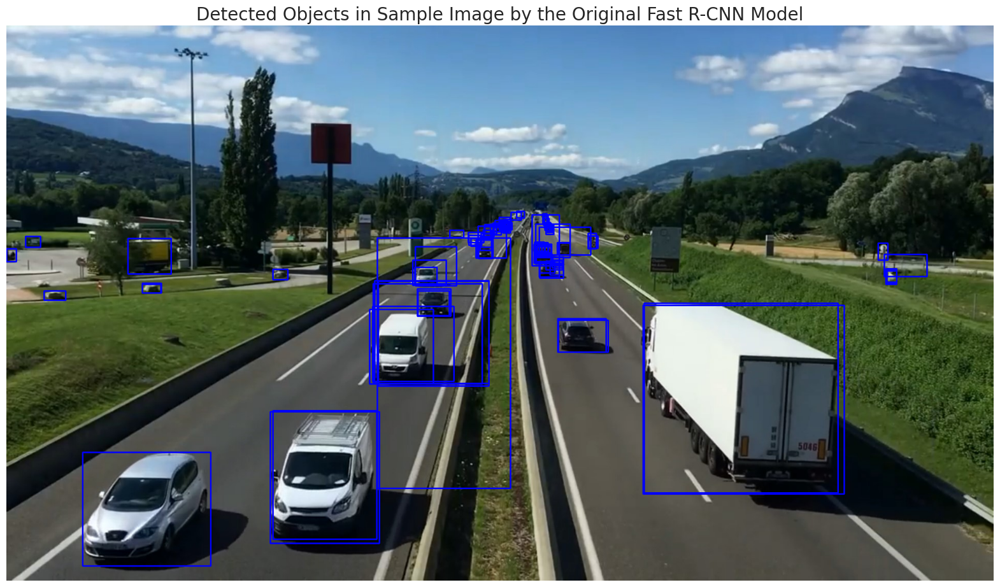

In [55]:
# Path to the image file
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using the fine-tuned Faster R-CNN model
# Preprocess the image
transform = transforms.Compose([transforms.ToTensor()])
image = Image.open(sample_image_path)
image_tensor = transform(image).unsqueeze(0)

# Run inference
with torch.no_grad():
    prediction = model(image_tensor)

# Visualize the prediction
image = cv2.imread(sample_image_path)
for box in prediction[0]['boxes']:
    box = box.detach().numpy().astype(int)
    cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), 2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(image)
plt.title('Detected Objects in Sample Image by the Original Fast R-CNN Model', fontsize=20)
plt.axis('off')
plt.show()


## Faster RCNN (FINE-TUNED)

In [47]:
# Path to your .pth file containing the pretrained model
pth_file_path = "best_model_weights.pth"

# Load the pretrained model
model = torch.load(pth_file_path, map_location=torch.device('cpu'))

# Put the model in evaluation mode
model.eval()


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

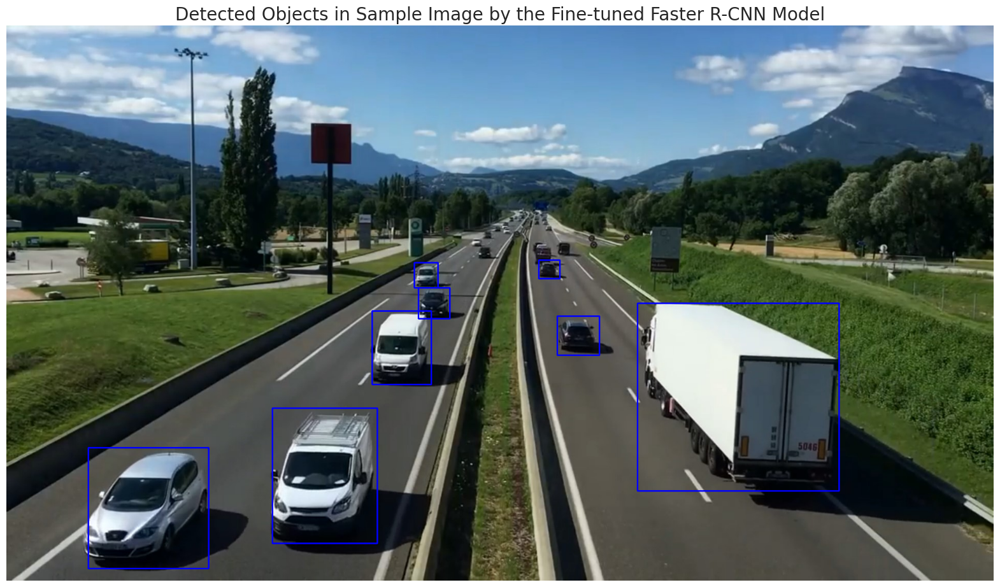

In [49]:
# Path to the image file
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using the fine-tuned Faster R-CNN model
# Preprocess the image
transform = transforms.Compose([transforms.ToTensor()])
image = Image.open(sample_image_path)
image_tensor = transform(image).unsqueeze(0)

# Run inference
with torch.no_grad():
    prediction = model(image_tensor)

# Visualize the prediction
image = cv2.imread(sample_image_path)
for box in prediction[0]['boxes']:
    box = box.detach().numpy().astype(int)
    cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), 2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(image)
plt.title('Detected Objects in Sample Image by the Fine-tuned Faster R-CNN Model', fontsize=20)
plt.axis('off')
plt.show()

In [50]:
#----------------------------PERFORM EVALUATION----------------------------#

def evaluate_model(model, dataset):
    model.eval()

    y_true = []
    y_scores = []
    y_pred = []

    for i in range(len(dataset)):
        image, target = dataset[i]
        if target is None:
            continue

        # Get ground truth labels
        true_boxes = target['boxes'].numpy()
        true_labels = target['labels'].numpy()

        # Convert image to tensor
        image_tensor = TF.to_tensor(image)
        image_tensor = image_tensor.unsqueeze(0)

        # Perform inference
        with torch.no_grad():
            prediction = model(image_tensor)

        # Get predicted boxes and scores
        pred_boxes = prediction[0]['boxes'].numpy()
        scores = prediction[0]['scores'].numpy()

        # Match predicted boxes with true boxes
        matched_true_boxes = np.zeros(len(true_boxes), dtype=bool)
        for pred_box, score in zip(pred_boxes, scores):
            iou = calculate_iou(pred_box, true_boxes)
            max_iou_idx = np.argmax(iou)
            if iou[max_iou_idx] >= 0.5 and not matched_true_boxes[max_iou_idx]:
                y_true.append(1)
                y_scores.append(score)
                y_pred.append(1)
                matched_true_boxes[max_iou_idx] = True
            else:
                y_true.append(0)
                y_scores.append(score)
                y_pred.append(0)

    # Calculate precision and recall
    precision, recall, _ = precision_recall_curve(y_true, y_scores)

    # Calculate average precision
    average_precision = average_precision_score(y_true, y_scores)

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Calculate mAP50 and mAP50-95
    mAP50 = average_precision
    mAP50_95 = calculate_mAP(cm, threshold=0.5)

    # Calculate precision and recall at threshold 0.5
    idx = np.where(recall >= 0.5)[0][0]
    precision_at_50 = precision[idx]
    recall_at_50 = recall[idx]

    # Calculate fitness
    fitness = (mAP50 + mAP50_95) / 2

    return {
        "precision": precision_at_50,
        "recall": recall_at_50,
        "mAP50": mAP50,
        "mAP50-95": mAP50_95,
        "fitness": fitness
    }

def calculate_iou(box1, box2):
    # Calculate intersection coordinates
    x1 = np.maximum(box1[0], box2[:, 0])
    y1 = np.maximum(box1[1], box2[:, 1])
    x2 = np.minimum(box1[2], box2[:, 2])
    y2 = np.minimum(box1[3], box2[:, 3])

    # Calculate intersection area
    intersection_area = np.maximum(0, x2 - x1) * np.maximum(0, y2 - y1)

    # Calculate box areas
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])

    # Calculate union area
    union_area = box1_area + box2_area - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area

    return iou

def calculate_mAP(confusion_matrix, threshold=0.5):
    tp = confusion_matrix[1, 1]
    fp = confusion_matrix[0, 1]
    fn = confusion_matrix[1, 0]

    precision = tp / (tp + fp)
    recall = tp / (tp + fn)

    if precision == 0 or recall == 0:
        return 0

    beta = 1
    f_score = (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall)

    return f_score

# Load the fine-tuned Faster R-CNN model
#model = ...  # Load your fine-tuned model here

# Load the validation dataset
dataset = CustomDataset(dataset_path2, mode='valid')

# Evaluate the model on the validation dataset
evaluation_results = evaluate_model(model, dataset)

# Print evaluation results
print("Precision at 0.5 Threshold:", evaluation_results["precision"])
print("Recall at 0.5 Threshold:", evaluation_results["recall"])
print("mAP50:", evaluation_results["mAP50"])
print("mAP50-95:", evaluation_results["mAP50-95"])
print("Fitness:", evaluation_results["fitness"])


Precision at 0.5 Threshold: 0.842843779232928
Recall at 0.5 Threshold: 1.0
mAP50: 0.9602768370737809
mAP50-95: 1.0
Fitness: 0.9801384185368904


## Final Visualization Plots

In [61]:
import matplotlib.pyplot as plt

# Original YOLOv8 metric values
original_metrics_yolo = {
    "precision": 0.633,
    "recall": 0.475,
    "mAP50": 0.521,
    "mAP50-95": 0.371,
    "fitness": 0.386
}

#original_sub_values_yolo = list(original_metrics_yolo.values())

# Fine-tuned YOLOv8 metric values
fine_tuned_metrics_yolo = {
    "precision": 0.860,
    "recall": 0.928,
    "mAP50": 0.952,
    "mAP50-95": 0.691,
    "fitness": 0.717
}

#fine_tuned_sub_values_yolo = list(fine_tuned_metrics_yolo.values())

# Original Fast R-CNN metric values
original_metrics_rcnn = {
    "precision": 0.15942536790469516,
    "recall": 1.0,
    "mAP50": 0.639,
    "mAP50-95": 1.0,
    "fitness": 0.819
}

#original_sub_values_rcnn = list(original_metrics_rcnn.values())

# Faster R-CNN metric values
faster_rcnn_metrics = {
    "precision": 0.842843779232928,
    "recall": 1.0,
    "mAP50": 0.9602768370737809,
    "mAP50-95": 1.0,
    "fitness": 0.9801384185368904
}


# Metric names
metrics = list(original_metrics_yolo.keys())

# Original YOLOv8 metric values
original_values_yolo = list(original_metrics_yolo.values())

# Fine-tuned YOLOv8 metric values
fine_tuned_values_yolo = list(fine_tuned_metrics_yolo.values())

# Original Fast R-CNN metric values
original_values_rcnn = list(original_metrics_rcnn.values())

# Faster R-CNN metric values
faster_rcnn_values = list(faster_rcnn_metrics.values())


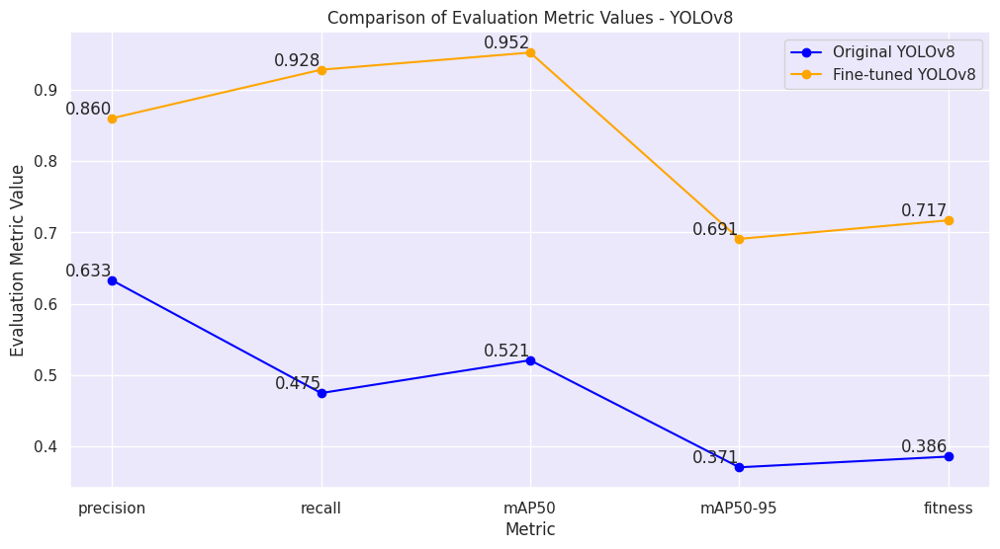

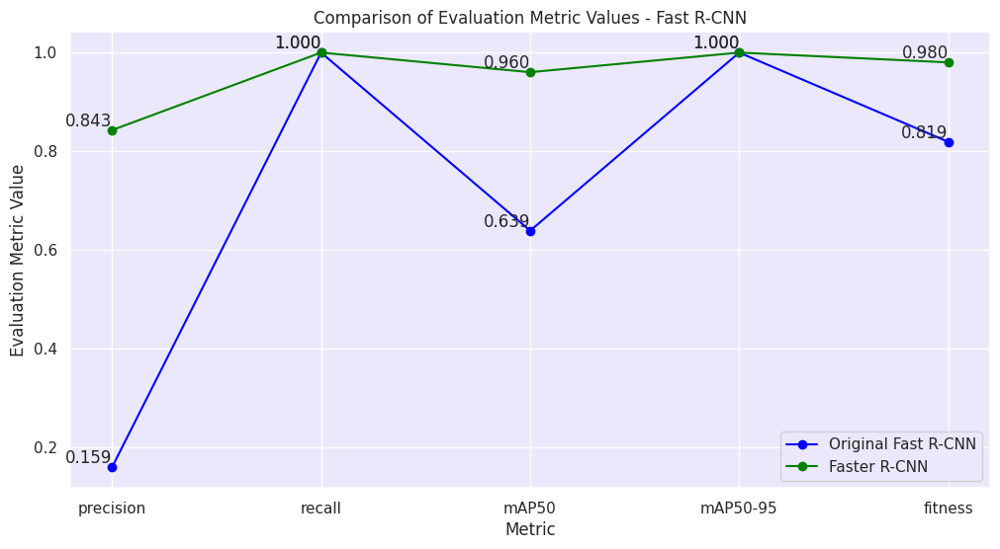

In [62]:
# Plotting for YOLOv8
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(metrics) + 1), original_values_yolo, marker='o', color='blue', label='Original YOLOv8')
plt.plot(range(1, len(metrics) + 1), fine_tuned_values_yolo, marker='o', color='orange', label='Fine-tuned YOLOv8')
for i, value in enumerate(original_values_yolo):
    plt.text(i + 1, value, f'{value:.3f}', ha='right', va='bottom')
for i, value in enumerate(fine_tuned_values_yolo):
    plt.text(i + 1, value, f'{value:.3f}', ha='right', va='bottom')
plt.xticks(range(1, len(metrics) + 1), metrics)
plt.xlabel('Metric')
plt.ylabel('Evaluation Metric Value')
plt.title('Comparison of Evaluation Metric Values - YOLOv8')
plt.legend()
plt.grid(True)

# Plotting for Fast R-CNN
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(metrics) + 1), original_values_rcnn, marker='o', color='blue', label='Original Fast R-CNN')
plt.plot(range(1, len(metrics) + 1), faster_rcnn_values, marker='o', color='green', label='Faster R-CNN')
for i, value in enumerate(original_values_rcnn):
    plt.text(i + 1, value, f'{value:.3f}', ha='right', va='bottom')
for i, value in enumerate(faster_rcnn_values):
    plt.text(i + 1, value, f'{value:.3f}', ha='right', va='bottom')
plt.xticks(range(1, len(metrics) + 1), metrics)
plt.xlabel('Metric')
plt.ylabel('Evaluation Metric Value')
plt.title('Comparison of Evaluation Metric Values - Fast R-CNN')
plt.legend()
plt.grid(True)

plt.show()


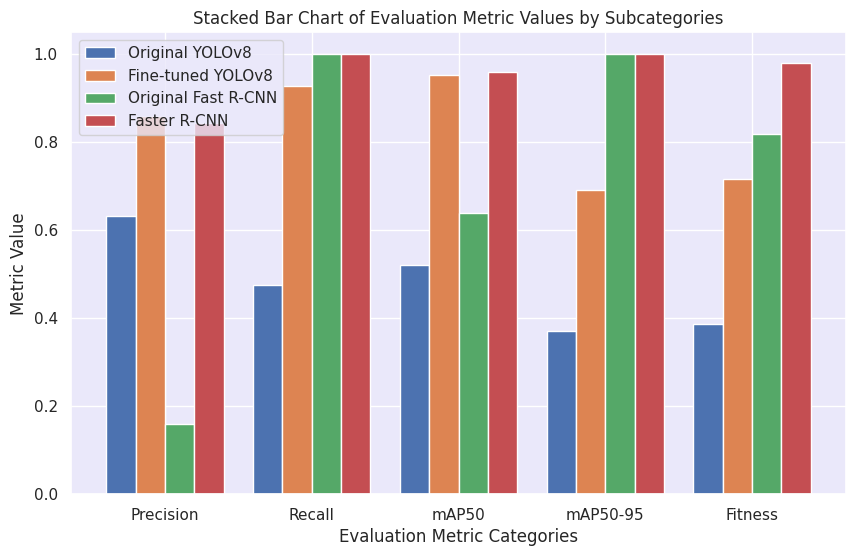

In [63]:
import numpy as np
import matplotlib.pyplot as plt

# Subcategory names
subcategories = ['Precision', 'Recall', 'mAP50', 'mAP50-95', 'Fitness']

original_sub_values_yolo = list(original_metrics_yolo.values())
fine_tuned_sub_values_yolo = list(fine_tuned_metrics_yolo.values())
original_sub_values_rcnn = list(original_metrics_rcnn.values())
faster_rcnn_sub_values = list(faster_rcnn_metrics.values())

# Plotting
plt.figure(figsize=(10, 6))

bar_width = 0.2
index = np.arange(len(subcategories))

plt.bar(index, original_sub_values_yolo, bar_width, label='Original YOLOv8')
plt.bar(index + bar_width, fine_tuned_sub_values_yolo, bar_width, label='Fine-tuned YOLOv8')
plt.bar(index + 2 * bar_width, original_sub_values_rcnn, bar_width, label='Original Fast R-CNN')
plt.bar(index + 3 * bar_width, faster_rcnn_sub_values, bar_width, label='Faster R-CNN')

plt.xlabel('Evaluation Metric Categories')
plt.ylabel('Metric Value')
plt.title('Stacked Bar Chart of Evaluation Metric Values by Subcategories')
plt.xticks(index + bar_width * 1.5, subcategories)
plt.legend()
plt.grid(True)
plt.show()


## Appendix

In [64]:
#Extra: Visualization Idea: Yolov8 (or any other)
'''
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame (replace this with your actual DataFrame)
metrics_df = pd.DataFrame({
    'metrics/precision(B)': [0.860],
    'metrics/recall(B)': [0.928],
    'metrics/mAP50(B)': [0.952],
    'metrics/mAP50-95(B)': [0.691],
    'fitness': [0.717]
})

# Transpose the DataFrame
metrics_df = metrics_df.T
metrics_df.columns = ['Metric Value']

# Reset index to have metrics as a column
metrics_df.reset_index(inplace=True)
metrics_df.rename(columns={'index': 'Metric'}, inplace=True)

# Create a line plot
plt.figure(figsize=(10, 6))
for metric in metrics_df['Metric']:
    plt.plot(metrics_df[metrics_df['Metric'] == metric].index,
             metrics_df[metrics_df['Metric'] == metric]['Metric Value'],
             marker='o', label=metric)

# Add labels and title
plt.xlabel('Metrics')
plt.ylabel('Metric Value')
plt.title('Comparative Metrics')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()
'''

"\nimport pandas as pd\nimport matplotlib.pyplot as plt\n\n# Sample DataFrame (replace this with your actual DataFrame)\nmetrics_df = pd.DataFrame({\n    'metrics/precision(B)': [0.860],\n    'metrics/recall(B)': [0.928],\n    'metrics/mAP50(B)': [0.952],\n    'metrics/mAP50-95(B)': [0.691],\n    'fitness': [0.717]\n})\n\n# Transpose the DataFrame\nmetrics_df = metrics_df.T\nmetrics_df.columns = ['Metric Value']\n\n# Reset index to have metrics as a column\nmetrics_df.reset_index(inplace=True)\nmetrics_df.rename(columns={'index': 'Metric'}, inplace=True)\n\n# Create a line plot\nplt.figure(figsize=(10, 6))\nfor metric in metrics_df['Metric']:\n    plt.plot(metrics_df[metrics_df['Metric'] == metric].index,\n             metrics_df[metrics_df['Metric'] == metric]['Metric Value'],\n             marker='o', label=metric)\n\n# Add labels and title\nplt.xlabel('Metrics')\nplt.ylabel('Metric Value')\nplt.title('Comparative Metrics')\n\n# Rotate x-axis labels for better readability\nplt.xticks

In [ ]:
'''
import numpy as np

# Create a radar chart
categories = metrics_df['Metric'].tolist()
values = metrics_df['Metric Value'].tolist()

N = len(categories)
angles = [n / float(N) * 2 * np.pi for n in range(N)]
values += values[:1]
angles += angles[:1]

plt.figure(figsize=(10, 6))
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories, color='black', size=10)
ax.plot(angles, values)
ax.fill(angles, values, 'blue', alpha=0.1)
plt.title('Comparative Metrics', size=20, color='black', y=1.1)
plt.tight_layout()
plt.show()
'''